# Covid-19 Data analysis (Updated 13th April 2020)

Notebook inspired by this [Medium Article](https://towardsdatascience.com/visualizing-the-coronavirus-pandemic-with-choropleth-maps-7f30fccaecf5).

Dataset from https://www.kaggle.com/sudalairajkumar/novel-corona-virus-2019-dataset

This notebook explores a coronavirus dataset from Kaggle to perform some simple interactive visualisations with the Plotly library package.

# Additional info with this dataset

<li> There are multiple reports for the same date - reports are not representative of the actual count at the end of the day
<li> Some countries report cumulative figures but some only report changes

In [6]:
# Import libraries

# Data analysis libraries
import numpy as np
import pandas as pd
import datetime

# Visualisation libraries
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [7]:
# Read Data

filepath = "covid_19_data.csv"
df = pd.read_csv(filepath)
df

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
15764,15765,04/16/2020,Wyoming,US,2020-04-16 23:38:19,296.0,2.0,0.0
15765,15766,04/16/2020,Xinjiang,Mainland China,2020-04-16 23:38:19,76.0,3.0,73.0
15766,15767,04/16/2020,Yukon,Canada,2020-04-16 23:38:19,8.0,0.0,0.0
15767,15768,04/16/2020,Yunnan,Mainland China,2020-04-16 23:38:19,184.0,2.0,176.0


In [8]:
# Check null values

df.isna().sum()

SNo                   0
ObservationDate       0
Province/State     7829
Country/Region        0
Last Update           0
Confirmed             0
Deaths                0
Recovered             0
dtype: int64

In [9]:
# Rename columns
df = df.rename(columns={'Country/Region':'Country'})
df = df.rename(columns={'ObservationDate':'Date'})

# Convert date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Change the date format to day-month-year (but in string format) however, doesn't work with line plots
# df['Date'] = df['Date'].dt.strftime('%d/%m/%Y')


# Puts country into categories which uses less memory and also combines multiple entries into one entity - 
# Allows legends to be shown in order for plotly
df['Country'] = pd.Categorical(df["Country"])


df

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
0,1,2020-01-22,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,2020-01-22,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,2020-01-22,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,2020-01-22,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,2020-01-22,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
15764,15765,2020-04-16,Wyoming,US,2020-04-16 23:38:19,296.0,2.0,0.0
15765,15766,2020-04-16,Xinjiang,Mainland China,2020-04-16 23:38:19,76.0,3.0,73.0
15766,15767,2020-04-16,Yukon,Canada,2020-04-16 23:38:19,8.0,0.0,0.0
15767,15768,2020-04-16,Yunnan,Mainland China,2020-04-16 23:38:19,184.0,2.0,176.0


In [10]:
# Another way to just look at statistics of one country

dfChina = df[df['Country'] == 'Mainland China']

dfChina.Confirmed.describe()

count     2664.000000
mean      2059.472973
std      10196.061695
min          0.000000
25%         90.000000
50%        226.500000
75%        585.250000
max      67803.000000
Name: Confirmed, dtype: float64

In [11]:
# Checking datatypes
df.dtypes

SNo                        int64
Date              datetime64[ns]
Province/State            object
Country                 category
Last Update               object
Confirmed                float64
Deaths                   float64
Recovered                float64
dtype: object

# Plotting linechart with Plotly

In [12]:
grouped = df.groupby(['Date', 'Country']).sum().reset_index()
grouped

,Date,Country,SNo,Confirmed,Deaths,Recovered
0,2020-01-22,Azerbaijan,NaN,NaN,NaN,NaN
1,2020-01-22,"('St. Martin',)",NaN,NaN,NaN,NaN
2,2020-01-22,Afghanistan,NaN,NaN,NaN,NaN
3,2020-01-22,Albania,NaN,NaN,NaN,NaN
4,2020-01-22,Algeria,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
18915,2020-04-16,Western Sahara,15627.0,6.0,0.0,0.0
18916,2020-04-16,Yemen,15628.0,1.0,0.0,0.0
18917,2020-04-16,Zambia,15629.0,48.0,2.0,30.0
18918,2020-04-16,Zimbabwe,15630.0,23.0,3.0,1.0


In [13]:
# Better way to use groupby data

grouped = df.groupby(['Date','Country'])['Confirmed', 'Deaths', 'Recovered'].max()
grouped

C:\Users\Alistair\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



Confirmed  Deaths  Recovered
Date       Country                                                     
2020-01-22  Azerbaijan                           NaN     NaN        NaN
           ('St. Martin',)                       NaN     NaN        NaN
           Afghanistan                           NaN     NaN        NaN
           Albania                               NaN     NaN        NaN
           Algeria                               NaN     NaN        NaN
...                                              ...     ...        ...
2020-04-16 Western Sahara                        6.0     0.0        0.0
           Yemen                                 1.0     0.0        0.0
           Zambia                               48.0     2.0       30.0
           Zimbabwe                             23.0     3.0        1.0
           occupied Palestinian territory        NaN     NaN        NaN

[18920 rows x 3 columns]

In [ ]:
# Plotting cornavirus cases per country with date

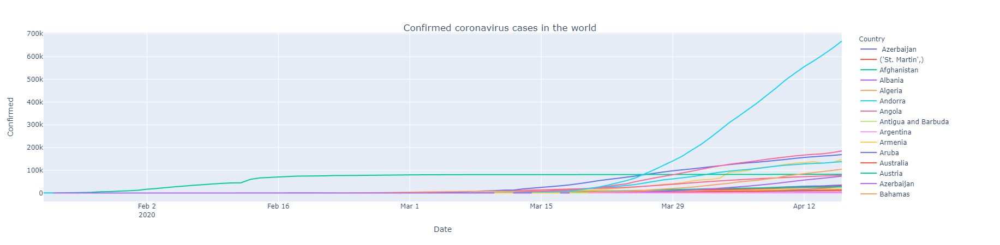

In [14]:
# Summing the data in the confirmed/deaths/recovered, groupby keeps the 'date' and 'country' columns
grouped = df.groupby(['Date','Country']).sum().reset_index()

# Plotting a line chart of the countries using plotly.express
fig = px.line(
    grouped, 
    x="Date", 
    y="Confirmed", 
    color="Country")

# Modifying the title to be in the centre at the top of the figure
fig.update_layout(
    title={
        'text':'Confirmed coronavirus cases in the world',
        'y':0.9,
        'x':0.5,
        'xanchor':'center',
        'yanchor':'top'
    })

fig.show()

# Plotting cornavirus cases per country with date formatted

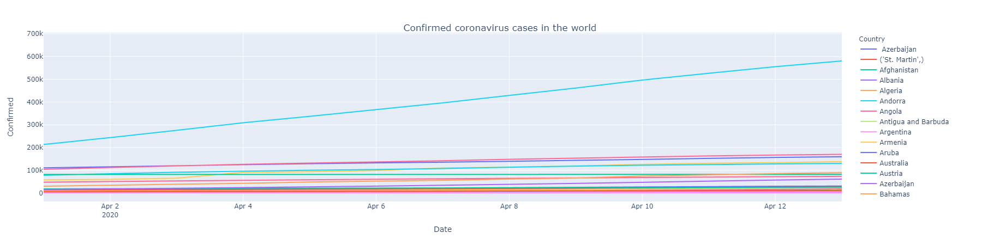

In [15]:
# Plotting a line chart of the countries using plotly.express
grouped = df.groupby(['Date','Country']).sum().reset_index()
fig = px.line(
    grouped, 
    x="Date", 
    y="Confirmed", 
    color="Country")

# Modifying the title to be in the centre at the top of the figure
fig.update_layout(
    title={
        'text':'Confirmed coronavirus cases in the world',
        'y':0.9,
        'x':0.5,
        'xanchor':'center',
        'yanchor':'top'
    })

# Set the range of dates to observe, requires importing datetime
fig.update_layout(
    xaxis_range=[datetime.datetime(2020, 4, 1), datetime.datetime(2020, 4, 13)])

# Plotting linechart with a rangeslider function to specify dates window intervals

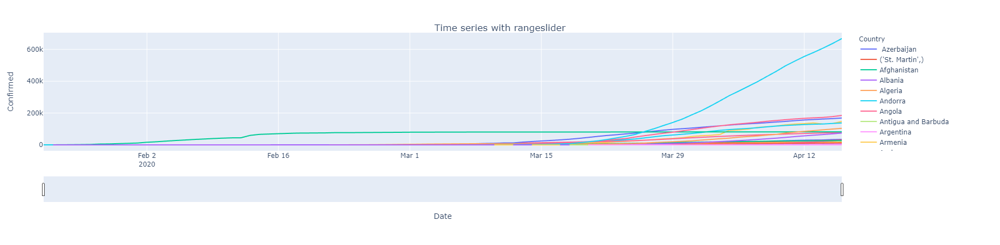

In [13]:
# Plotting a line chart of the countries using plotly.express
grouped = df.groupby(['Date','Country']).sum().reset_index()
fig = px.line(
    grouped, 
    x="Date", 
    y="Confirmed", 
    color="Country")

# Modifying the title to be in the centre at the top of the figure
fig.update_layout(
    title={
        'text':'Time series with rangeslider',
        'y':0.9,
        'x':0.5,
        'xanchor':'center',
        'yanchor':'top'
    })

# Adding a rangeslider to add a window for viewing dates
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Rangeslider with buttons

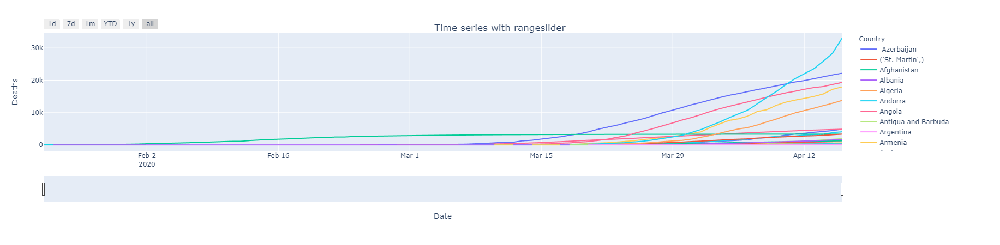

In [14]:
# Plotting a line chart of the countries using plotly.express
grouped = df.groupby(['Date','Country']).sum().reset_index()
fig = px.line(
    grouped, 
    x="Date", 
    y="Deaths", 
    color="Country")

# Modifying the title to be in the centre at the top of the figure
fig.update_layout(
    title={
        'text':'Time series with rangeslider',
        'y':0.9,
        'x':0.5,
        'xanchor':'center',
        'yanchor':'top'
    })

# Adding a rangeslider with BUTTONS in the top left to narrow data
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1d", step="day", stepmode="backward"),
            dict(count=7, label="7d", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)


# Choropleth map figures

## Plotting coronavirus cases on the world map

In [17]:
# Manipulating Dataframe to prepare for plotting choropleth figures

# Remove province/state duplicates, sum adds the confirmed, deaths and recovered values
df_countries = df.groupby(['Country', 'Date']).sum().reset_index().sort_values('Date', ascending=False) 

# Remove any duplicated countries to get the most recent date
df_countries = df_countries.drop_duplicates(subset = ['Country'])

# Only show confirmed changes
df_countries = df_countries[df_countries['Confirmed']>0]

df_countries

,Country,Date,SNo,Confirmed,Deaths,Recovered
10749,Malaysia,2020-04-16,15551.0,5182.0,84.0,2766.0
10663,Malawi,2020-04-16,15550.0,16.0,2.0,0.0
10577,Mainland China,2020-04-16,486709.0,82341.0,3342.0,77900.0
10491,Madagascar,2020-04-16,15549.0,111.0,0.0,33.0
17285,Togo,2020-04-16,15614.0,81.0,5.0,45.0
...,...,...,...,...,...,...
7223,Guatemala,2020-04-16,15515.0,196.0,5.0,19.0
7653,Haiti,2020-04-16,15519.0,41.0,3.0,0.0
6621,Ghana,2020-04-16,15512.0,641.0,8.0,83.0
4385,Cyprus,2020-04-16,15490.0,735.0,12.0,77.0


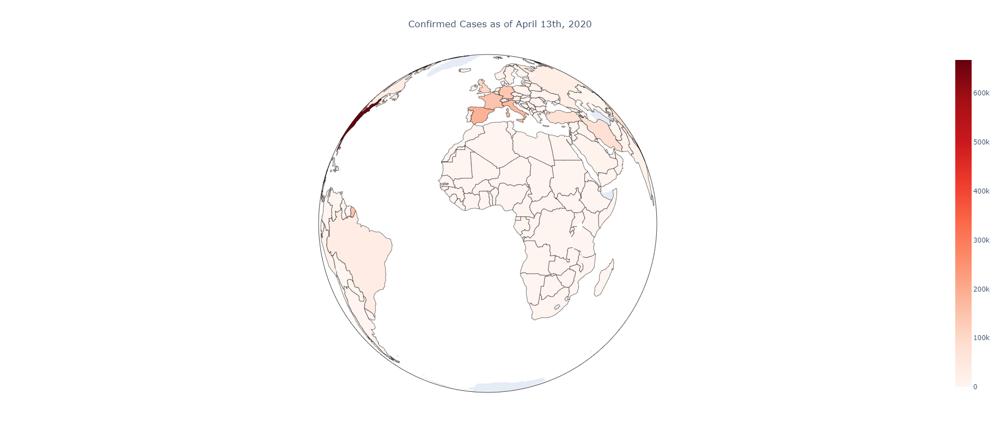

In [18]:
# Create the Choropleth using go.Figure
fig = go.Figure(
    data=go.Choropleth(
        locations = df_countries['Country'], 
        locationmode = 'country names', 
        z = df_countries['Confirmed'], 
        colorscale = 'Reds', 
        marker_line_color = 'black', 
        marker_line_width = 0.5, ))

fig.update_layout(
    title_text = 'Confirmed Cases as of April 13th, 2020', 
    title_x = 0.5, 
    geo=dict(
        showframe = True, 
        showcoastlines = False, 
        projection_type = 'orthographic'), 
    width=800, 
    height=800)

# multiple projection types: equirectangular, mercator, orthographic, etc...

# Animated choropleth

## A timelapse of coronavirus cases on a world map

In [20]:
# Manipulating the original dataframe

# Only incorporate changes in confirmed
df_countrydate = df[df['Confirmed']>0] 

# Remove province/state duplicates, sum adds the confirmed, deaths and recovered values
df_countrydate = df_countrydate.groupby(['Date','Country']).sum().reset_index()

df_countrydate['Confirmed'].fillna(0, inplace = True)
df_countrydate['Deaths'].fillna(0, inplace = True)
df_countrydate['Recovered'].fillna(0, inplace = True)
# df_countrydate.fillna(0, inplace=True) - doesn't work...

# Drop the SNo
df_countrydate.drop('SNo', axis=1, inplace=True) 

# ****Need to convert the date back into string for animated chloropleth
# df_countrydate['Date'] = df_countrydate['Date'].astype('string')
df_countrydate['Date'] = df_countrydate['Date'].dt.strftime('%d/%m/%Y')

df_countrydate

,Date,Country,Confirmed,Deaths,Recovered
0,22/01/2020,Azerbaijan,0.0,0.0,0.0
1,22/01/2020,"('St. Martin',)",0.0,0.0,0.0
2,22/01/2020,Afghanistan,0.0,0.0,0.0
3,22/01/2020,Albania,0.0,0.0,0.0
4,22/01/2020,Algeria,0.0,0.0,0.0
...,...,...,...,...,...
18915,16/04/2020,Western Sahara,6.0,0.0,0.0
18916,16/04/2020,Yemen,1.0,0.0,0.0
18917,16/04/2020,Zambia,48.0,2.0,30.0
18918,16/04/2020,Zimbabwe,23.0,3.0,1.0


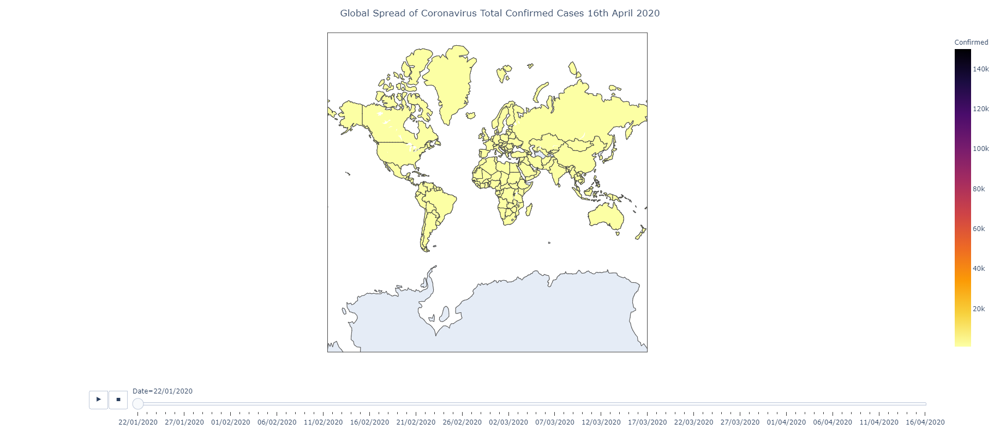

In [21]:
# Creating the visualization
fig = px.choropleth(df_countrydate, 
                    locations="Country", 
                    locationmode = "country names",
                    color="Confirmed", 
                    hover_name="Country",
                    hover_data = ['Recovered','Deaths'],
                    animation_frame="Date",
                    color_continuous_scale='Inferno_r',
                    projection='mercator',
                    range_color=[1000,150000], #sets the limit so the legend limits aren't automatically changing
                    width=800, 
                    height=800)

fig.update_layout(
    coloraxis_showscale=True, # Show the colouraxis scale legend
    title_text = 'Global Spread of Coronavirus Total Confirmed Cases 16th April 2020',
    title_x = 0.5,
    geo=dict(
        showframe = True,
        showcoastlines = True,))
    
fig.show()
fig.write_html('Global Spread of Coronavirus Total Confirmed Cases 16th April 2020.html')

# Looking at cases on the last date in the dataset

In [23]:
#Extract the last Number for plotting
LastDate = df[df.Date=='04/16/2020']
LastDate.sort_values('Confirmed', ascending=True)
#LastDate.shape
LastDate

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
15449,15450,2020-04-16,NaN,Afghanistan,2020-04-16 23:38:19,840.0,30.0,54.0
15450,15451,2020-04-16,NaN,Albania,2020-04-16 23:38:19,518.0,26.0,277.0
15451,15452,2020-04-16,NaN,Algeria,2020-04-16 23:38:19,2268.0,348.0,783.0
15452,15453,2020-04-16,NaN,Andorra,2020-04-16 23:38:19,673.0,33.0,169.0
15453,15454,2020-04-16,NaN,Angola,2020-04-16 23:38:19,19.0,2.0,5.0
...,...,...,...,...,...,...,...,...
15764,15765,2020-04-16,Wyoming,US,2020-04-16 23:38:19,296.0,2.0,0.0
15765,15766,2020-04-16,Xinjiang,Mainland China,2020-04-16 23:38:19,76.0,3.0,73.0
15766,15767,2020-04-16,Yukon,Canada,2020-04-16 23:38:19,8.0,0.0,0.0
15767,15768,2020-04-16,Yunnan,Mainland China,2020-04-16 23:38:19,184.0,2.0,176.0


## Bar plots of last date

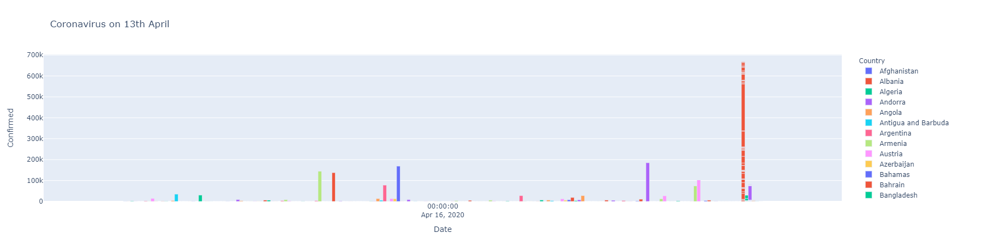

In [26]:
fig = px.bar(LastDate,x='Date',y='Confirmed', barmode='group', color='Country', title='Coronavirus on 13th April')
fig.show()

## Piechart of last date

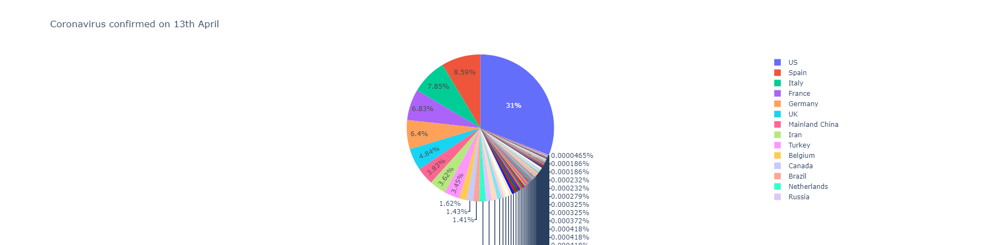

In [27]:
fig = px.pie(LastDate, values='Confirmed', names='Country', title='Coronavirus confirmed on 13th April')
fig.show()

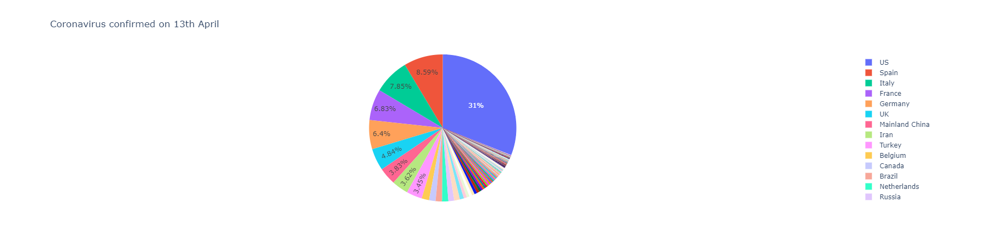

In [24]:
fig = px.pie(LastDate, values='Confirmed', names='Country', title='Coronavirus confirmed on 13th April')

# Remove the line labels
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')

fig.show()

# Top 10 affected countries

In [28]:
#Extract the last Number for plotting
# Filtering out less cases

LastDate = df[df.Date=='04/16/2020']
LastDate

Sorted = LastDate.sort_values(['Confirmed'], ascending=False)
Sorted

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
15713,15714,2020-04-16,New York,US,2020-04-16 23:38:19,223691.0,14832.0,0.0
15602,15603,2020-04-16,NaN,Spain,2020-04-16 23:38:19,184948.0,19315.0,74797.0
15529,15530,2020-04-16,NaN,Italy,2020-04-16 23:38:19,168941.0,22170.0,40164.0
15506,15507,2020-04-16,NaN,France,2020-04-16 23:38:19,145960.0,17920.0,32812.0
15510,15511,2020-04-16,NaN,Germany,2020-04-16 23:38:19,137698.0,4052.0,77000.0
...,...,...,...,...,...,...,...,...
15753,15754,2020-04-16,Tibet,Mainland China,2020-04-16 23:38:19,1.0,0.0,1.0
15627,15628,2020-04-16,NaN,Yemen,2020-04-16 23:38:19,1.0,0.0,0.0
15737,15738,2020-04-16,Saint Pierre and Miquelon,France,2020-04-16 23:38:19,1.0,0.0,0.0
15732,15733,2020-04-16,Recovered,Canada,2020-04-16 23:38:19,0.0,0.0,9698.0


In [29]:
Top10 = LastDate.nlargest(10,['Confirmed'])
Top10

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
15713,15714,2020-04-16,New York,US,2020-04-16 23:38:19,223691.0,14832.0,0.0
15602,15603,2020-04-16,NaN,Spain,2020-04-16 23:38:19,184948.0,19315.0,74797.0
15529,15530,2020-04-16,NaN,Italy,2020-04-16 23:38:19,168941.0,22170.0,40164.0
15506,15507,2020-04-16,NaN,France,2020-04-16 23:38:19,145960.0,17920.0,32812.0
15510,15511,2020-04-16,NaN,Germany,2020-04-16 23:38:19,137698.0,4052.0,77000.0
15617,15618,2020-04-16,NaN,UK,2020-04-16 23:38:19,103093.0,13729.0,0.0
15525,15526,2020-04-16,NaN,Iran,2020-04-16 23:38:19,77995.0,4869.0,52229.0
15710,15711,2020-04-16,New Jersey,US,2020-04-16 23:38:19,75317.0,3518.0,0.0
15616,15617,2020-04-16,NaN,Turkey,2020-04-16 23:38:19,74193.0,1643.0,7089.0
15677,15678,2020-04-16,Hubei,Mainland China,2020-04-16 23:38:19,67803.0,3222.0,64435.0


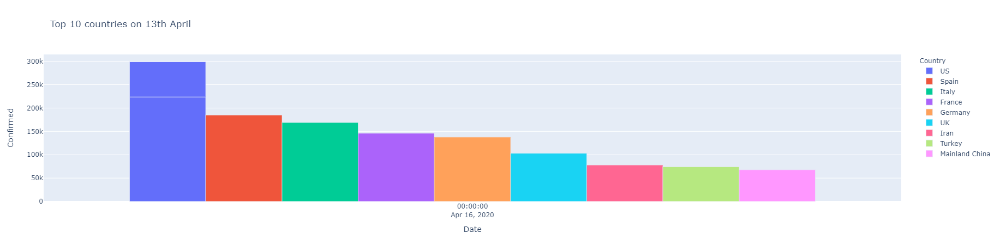

In [30]:
fig = px.bar(Top10,x='Date',y='Confirmed', barmode='group', color='Country', title='Top 10 countries on 13th April')
fig.show()

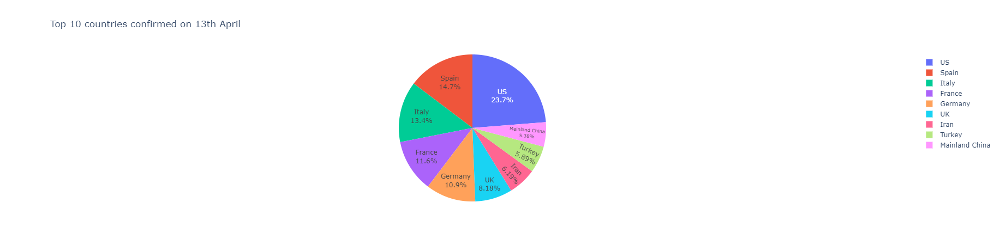

In [31]:
# Adding labels inside and additional hover data with another column data, however a second column data doesn't seem to work

fig = px.pie(Top10, values='Confirmed', names='Country', 
             title='Top 10 countries confirmed on 13th April',
            hover_data=['Deaths','Recovered'])

fig.update_traces(textposition='inside', textinfo='percent+label')       
fig.show()

## Using plotly.graphobjects to plot

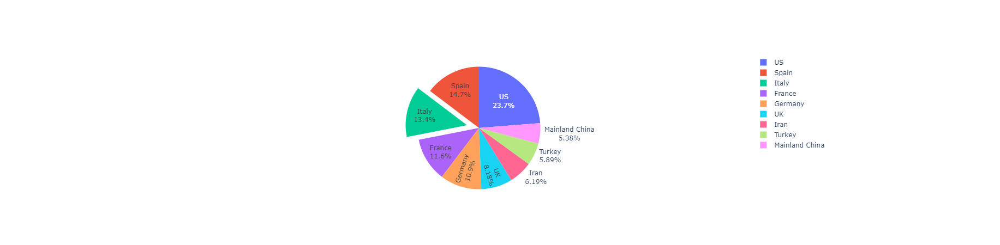

In [32]:
# Drawing in go with a pie out

labels = Top10['Country']
values = Top10['Confirmed']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent', pull=[0, 0, 0.2, 0])])
fig.update_traces(hoverinfo='label+percent', textfont_size=12)
fig.show()

## Donut piechart

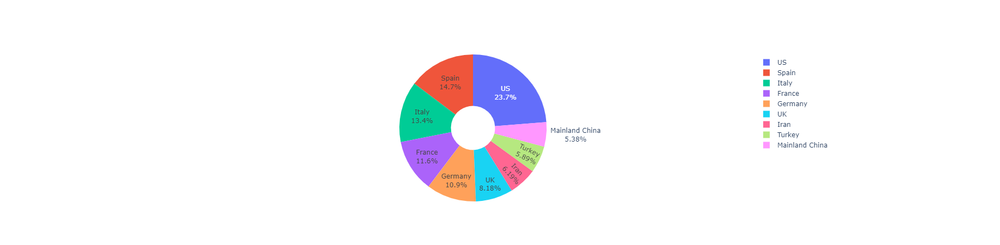

In [33]:
# Donut chart with go

labels = Top10['Country']
values = Top10['Confirmed']

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values,  textinfo='label+percent', hole=.3)])
fig.show()

# Piechart subplots

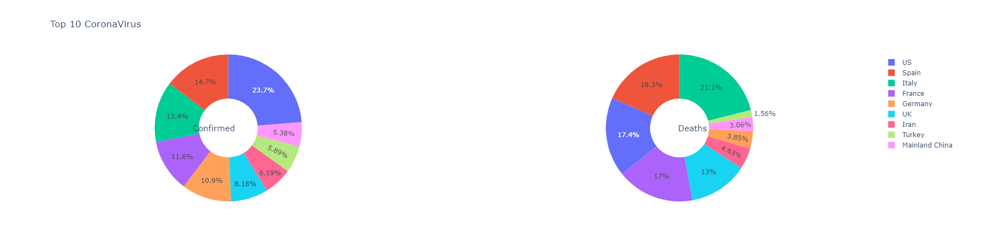

In [31]:
# Pie chart subplots
from plotly.subplots import make_subplots

labels = Top10['Country']
values = Top10['Confirmed']
values2 = Top10['Deaths']

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=values, name="Top10 Confirmed"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=values2, name="Top10 Deaths"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Top 10 CoronaVirus",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Confirmed', x=0.18, y=0.5, font_size=15, showarrow=False),
                 dict(text='Deaths', x=0.81, y=0.5, font_size=15, showarrow=False)])
fig.show()

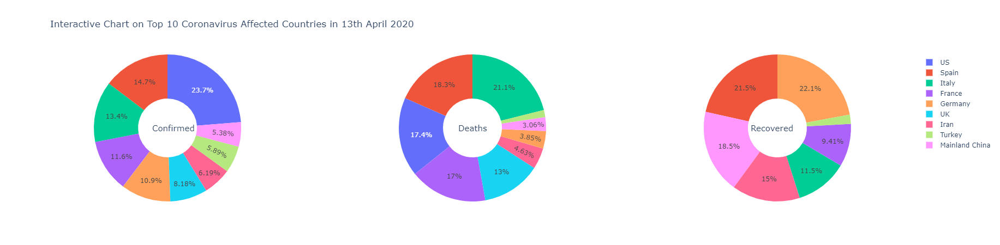

In [32]:
# Pie chart subplots
from plotly.subplots import make_subplots

labels = Top10['Country']
values = Top10['Confirmed']
values2 = Top10['Deaths']
values3 = Top10['Recovered']

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'}, {'type':'domain'},  {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=values, name="Top10 Confirmed"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=values2, name="Top10 Deaths"),
              1, 2)
fig.add_trace(go.Pie(labels=labels, values=values3, name="Top10 Recovered"),
              1, 3)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name+value")

fig.update_layout(
    title_text="Interactive Chart on Top 10 Coronavirus Affected Countries in 13th April 2020",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Confirmed', x=0.125, y=0.5, font_size=15, showarrow=False),
                dict(text='Deaths', x=0.50, y=0.5, font_size=15, showarrow=False),
                dict(text='Recovered', x=0.875, y=0.5, font_size=15, showarrow=False)])

# Set labels inside and hide the smaller percentages
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')

fig.show()

# Save chart as HTML
fig.write_html("Top10CoronaVirus.html")


## Stacked barplots

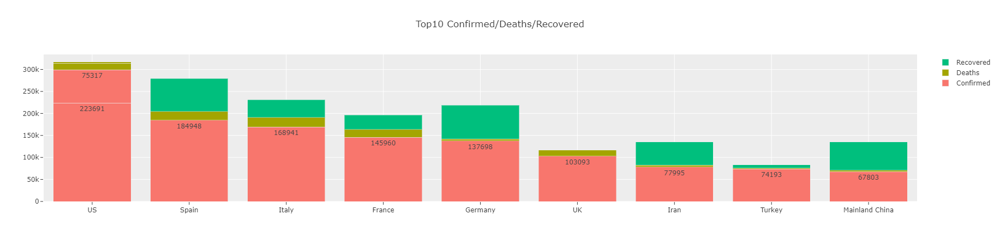

In [33]:
fig = go.Figure(data=[
    go.Bar(name='Confirmed', x=Top10['Country'], y=Top10['Confirmed'], text=Top10['Confirmed'], textposition='auto'),
    go.Bar(name='Deaths', x=Top10['Country'], y=Top10['Deaths']),
    go.Bar(name='Recovered', x=Top10['Country'], y=Top10['Recovered'])
])
# Change the bar mode
fig.update_layout(
    barmode='stack',
    title='Top10 Confirmed/Deaths/Recovered',
    template='ggplot2')
fig.show()

# Looking at USA Data

In [36]:
# Selecting US data only
dfUS = df[df['Country']=='US'][['Province/State','Date','Confirmed','Deaths','Recovered']]

# Filtering only changes in values and creating a confirmed only table
dfUSConf = dfUS[dfUS['Confirmed']>0] 
dfUSDeaths = dfUS[dfUS['Deaths']>0] 
dfUSRec = dfUS[dfUS['Recovered']>0] 

# Sums up the reported changes by the date
dfUSConf1 = dfUSConf.groupby(['Date','Province/State']).sum().reset_index()
dfUSDeaths1 = dfUSDeaths.groupby(['Date','Province/State']).sum().reset_index()
dfUSRec1 = dfUSRec.groupby(['Date','Province/State']).sum().reset_index()

DeathsLD = dfUSDeaths[dfUSDeaths.Date=='04/13/2020'] 
DeathsLD

,Province/State,Date,Confirmed,Deaths,Recovered
14670,Alabama,2020-04-13,3734.0,99.0,0.0
14671,Alaska,2020-04-13,277.0,8.0,0.0
14675,Arizona,2020-04-13,3705.0,122.0,0.0
14676,Arkansas,2020-04-13,1410.0,29.0,0.0
14684,California,2020-04-13,23931.0,714.0,0.0
14688,Colorado,2020-04-13,7691.0,306.0,0.0
14689,Connecticut,2020-04-13,13381.0,602.0,0.0
14691,Delaware,2020-04-13,1758.0,41.0,0.0
14693,District of Columbia,2020-04-13,1955.0,52.0,0.0
14696,Florida,2020-04-13,21019.0,499.0,0.0


In [37]:
#Extract the last Number
LastDate = dfUSConf1[dfUSConf1.Date=='04/13/2020']
LastDate.shape

#Sort the values according to confirmed
LastDate = LastDate.sort_values('Confirmed', ascending=False)
LastDate

,Date,Province/State,Confirmed,Deaths,Recovered
2765,2020-04-13,New York,195749.0,10058.0,0.0
2763,2020-04-13,New Jersey,64584.0,2443.0,0.0
2754,2020-04-13,Massachusetts,26867.0,844.0,0.0
2755,2020-04-13,Michigan,25635.0,1602.0,0.0
2772,2020-04-13,Pennsylvania,24292.0,589.0,0.0
2734,2020-04-13,California,23931.0,714.0,0.0
2746,2020-04-13,Illinois,22025.0,798.0,0.0
2740,2020-04-13,Florida,21019.0,499.0,0.0
2751,2020-04-13,Louisiana,21016.0,884.0,0.0
2778,2020-04-13,Texas,14275.0,305.0,0.0


# Analysis by US states


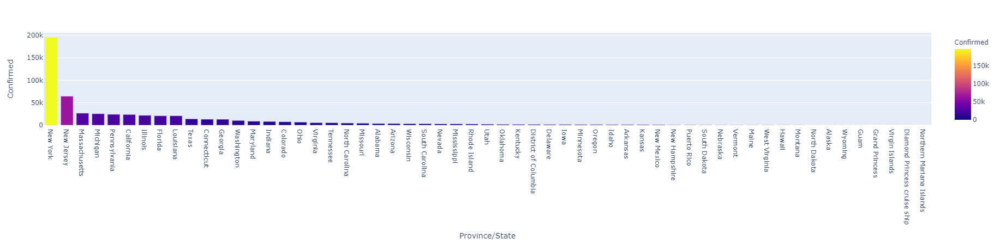

In [40]:
fig = px.bar(LastDate,x='Province/State',y='Confirmed', barmode='group', color='Confirmed')
fig.show()

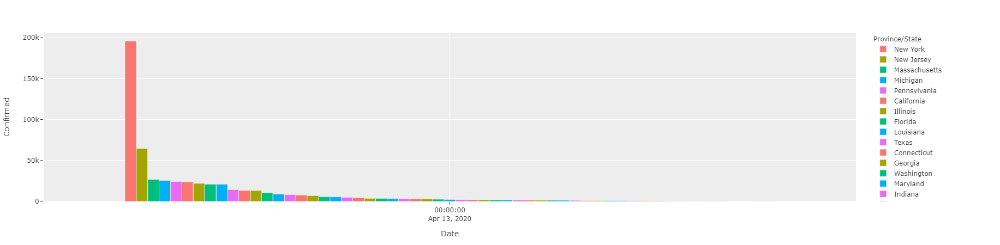

In [41]:
# Changing template style
fig = px.bar(LastDate,x='Date',y='Confirmed', barmode='group', template='ggplot2', color='Province/State')
fig.show()

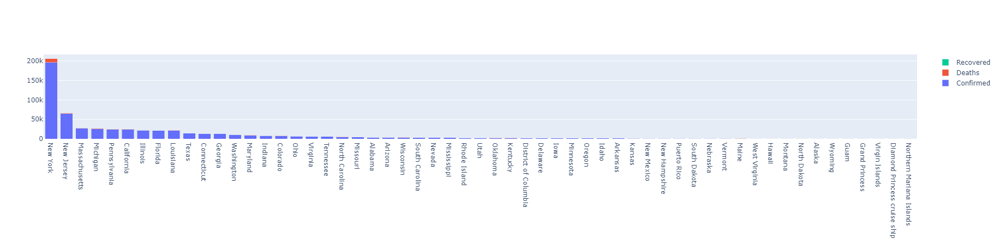

In [42]:
fig = go.Figure(data=[
    go.Bar(name='Confirmed', x=LastDate['Province/State'], y=LastDate['Confirmed']),
    go.Bar(name='Deaths', x=LastDate['Province/State'], y=LastDate['Deaths']),
    go.Bar(name='Recovered', x=LastDate['Province/State'], y=LastDate['Recovered'])
])
# Change the bar mode
fig.update_layout(barmode='stack')
fig.show()

# Treemap analysis 

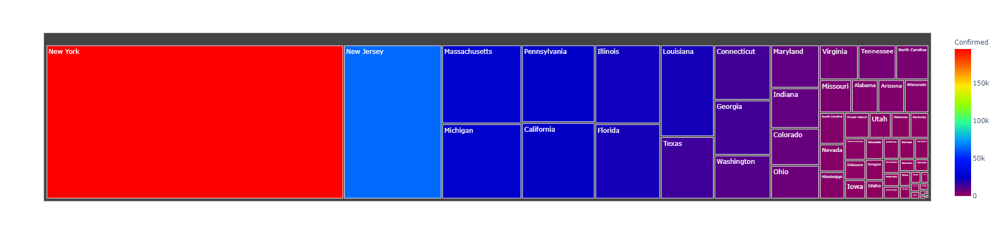

In [43]:
# Treemap figure

fig = px.treemap(
    LastDate, 
    path=['Province/State'], 
    values='Confirmed',
    color='Confirmed', 
    hover_data=['Deaths'],
    color_continuous_scale='Rainbow')
fig.show()

In [45]:
grouped = dfUS.groupby(['Date','Province/State']).sum().reset_index()
grouped['Date']

0      2020-01-22
1      2020-01-23
2      2020-01-24
3      2020-01-24
4      2020-01-25
          ...    
3071   2020-04-16
3072   2020-04-16
3073   2020-04-16
3074   2020-04-16
3075   2020-04-16
Name: Date, Length: 3076, dtype: datetime64[ns]

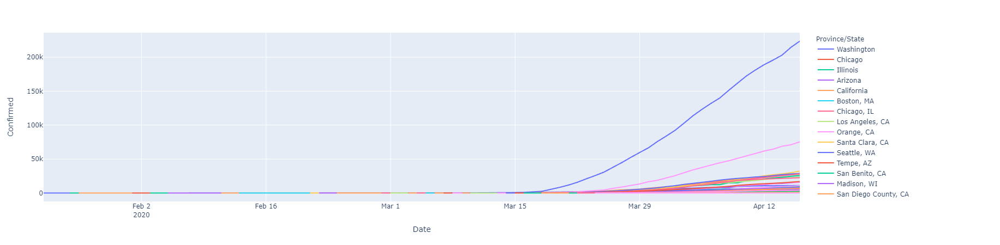

In [46]:
fig = px.line(grouped, x="Date", y="Confirmed", color="Province/State")
fig.show()

# Global outlook chart

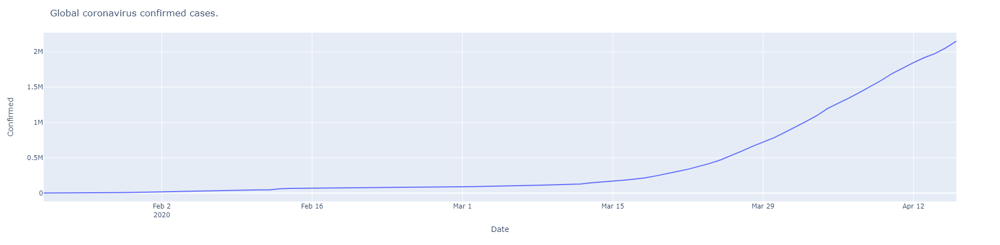

In [79]:
# Sum all the confirmed/deaths/recovered by date and reset the index (so date can then be plotted as a variable on a graph)
globaldf = df.groupby(['Date']).sum().reset_index()

# Drop the SNo column as it is pointless
globaldf.drop('SNo', axis=1, inplace=True)
globaldf

fig = px.line(globaldf, x='Date', y="Confirmed")
fig.update_layout(
    title="Global coronavirus confirmed cases.")
fig.show()

In [80]:
# Combining the global data with the original dataset
grouped = df.groupby(['Date','Country']).sum().reset_index()
combined = pd.concat([grouped, globaldf], axis =0)

# Fill the NA values as Global
combined['Country'].fillna('Global', inplace = True)

# Sort by date and country sum
combined = combined.groupby(['Date','Country']).sum().reset_index()

# List the countries in ascending alphabetical order
combined.sort_values(['Country'], ascending=True)

# Drop the useless SNo. column
combined.drop('SNo', axis=1, inplace=True)
combined

,Date,Country,Confirmed,Deaths,Recovered
0,2020-01-22,Azerbaijan,0.0,0.0,0.0
1,2020-01-22,"('St. Martin',)",0.0,0.0,0.0
2,2020-01-22,Afghanistan,0.0,0.0,0.0
3,2020-01-22,Albania,0.0,0.0,0.0
4,2020-01-22,Algeria,0.0,0.0,0.0
...,...,...,...,...,...
19001,2020-04-16,Western Sahara,6.0,0.0,0.0
19002,2020-04-16,Yemen,1.0,0.0,0.0
19003,2020-04-16,Zambia,48.0,2.0,30.0
19004,2020-04-16,Zimbabwe,23.0,3.0,1.0


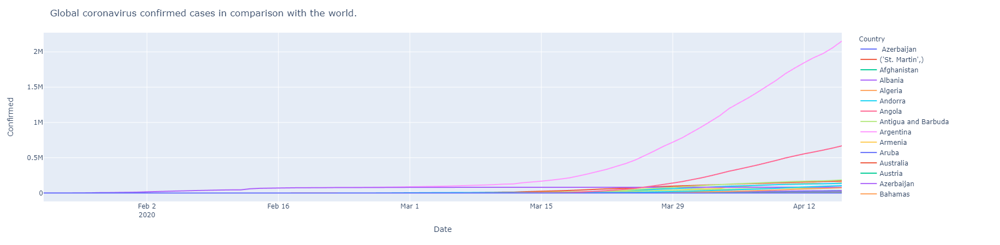

In [81]:
fig = px.line(combined, x="Date", y="Confirmed", color="Country")
fig.update_layout(title="Global coronavirus confirmed cases in comparison with the world.", legend_traceorder = 'normal')

fig.show()

# Save the chart as HTML so it can be used as an interactive shareable link

fig.write_html("Global Coronavirus Growth.html")

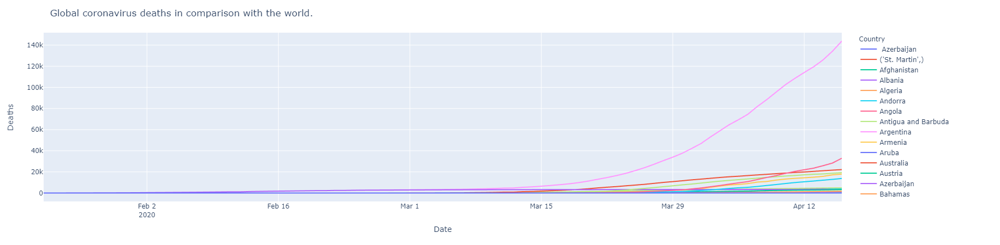

In [82]:
fig = px.line(combined, x="Date", y="Deaths", color="Country")
fig.update_layout(title="Global coronavirus deaths in comparison with the world.", legend_traceorder = 'normal')
fig.show()